# ICR - Identifying Age-Related Conditions Dataset with TensorFlow Decision Forests

The goal of this modeling is to predict if a person has one or more of any of three medical conditions or none.

Rough breakdown of notebook contents:

1. Import tensorflow and other libraries
2. Load Data
3. EDA
4. Data cleaning and preprocessing

# 1. Import Libraries

In [1]:
import tensorflow as tf
#import tensorflow_decision_forests as tfdf
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
# import sklearn.metrics as metrics
from keras import metrics

from sklearn.impute import SimpleImputer

from mlxtend.plotting import scatterplotmatrix
from mlxtend.plotting import heatmap

# from sklearn.model_selection import KFold
# from mlxtend.plotting import heatmap
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import mean_squared_error
# from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
# from sklearn.metrics import log_loss



#improve figure resolution
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'


pd.set_option('display.max_columns', None) #show all columns
pd.set_option('display.max_rows', None) #show all rows

2023-08-05 12:09:44.726427: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
print("TensorFlow v" + tf.__version__)
#print("TensorFlow Decision Forests v" + tfdf.__version__)

TensorFlow v2.12.0


# 2. Load Data

In [3]:
train_df = pd.read_csv('../icr-identify-age-related-conditions/train.csv')
print("Full train dataset shape is {}".format(train_df.shape))

greeks_df = pd.read_csv('../icr-identify-age-related-conditions/greeks.csv')
print("Greeks dataset shape is {}".format(greeks_df.shape))

Full train dataset shape is (617, 58)
Greeks dataset shape is (617, 6)


The data is composed of 58 columns and 617 entries. We can see all 58 dimensions(results will be truncated since the number of columns is big) of our dataset by printing out the first 5 entries using the following code:

In [4]:
train_df.head()

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,22.5984,175.638726,152.707705,823.928241,257.432377,47.223358,0.563481,23.387600,4.851915,0.023482,1.050225,0.069225,13.784111,1.302012,36.205956,69.08340,295.570575,0.23868,0.284232,89.245560,84.31664,29.657104,5.310690,1.74307,23.187704,7.294176,1.987283,1433.166750,0.949104,B,30.879420,78.526968,3.828384,13.394640,10.265073,9028.291921,3.583450,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,19.4205,155.868030,14.754720,51.216883,257.432377,30.284345,0.484710,50.628208,6.085041,0.031442,1.113875,1.117800,28.310953,1.357182,37.476568,70.79836,178.553100,0.23868,0.363489,110.581815,75.74548,37.532000,0.005518,1.74307,17.222328,4.926396,0.858603,1111.287150,0.003042,A,109.125159,95.415086,52.260480,17.175984,0.296850,6785.003474,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,26.4825,128.988531,219.320160,482.141594,257.432377,32.563713,0.495852,85.955376,5.376488,0.036218,1.050225,0.700350,39.364743,1.009611,21.459644,70.81970,321.426625,0.23868,0.210441,120.056438,65.46984,28.053464,1.289739,1.74307,36.861352,7.813674,8.146651,1494.076488,0.377208,B,109.125159,78.526968,5.390628,224.207424,8.745201,8338.906181,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0
3,043ac50845d5,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,4169.67738,23.6577,237.282264,11.050410,661.518640,257.432377,15.201914,0.717882,88.159360,2.347652,0.029054,1.400300,0.636075,41.116960,0.722727,21.530392,47.27586,196.607985,0.23868,0.292431,139.824570,71.57120,24.354856,2.655345,1.74307,52.003884,7.386060,3.813326,15691.552180,0.614484,B,31.674357,78.526968,31.323372,59.301984,7.884336,10965.766040,14.852022,6.122162,0.49706,0.284466,18.529584,82.416803,2094.262452,39.948656,90.493248,0.155829,0
4,044fb8a146ec,0.380297,3733.04844,85.200147,14.103738,8.138688,3.942255,0.054810,3.396778,102.151980,5728.73412,24.0108,324.546318,149.717165,6074.859475,257.432377,82.213495,0.536467,72.644264,30.537722,0.025472,1.050225,0.693150,31.724726,0.827550,34.415360,74.06532,200.178160,0.23868,0.207708,97.920120,52.83888,26.019912,1.144902,1.74307,9.064856,7.350720,3.490846,1403.656300,0.164268,B,109.125159,91.994825,51.141336,29.102640,4.274640,16198.049590,13.666727,8.153058,48.50134,0.121914,16.408728,146.109943,8524.370502,45.381316,36.262628,0.096614,1


`Class` is the label column indicating if a person has one or more of any of the three medical conditions (i.e,`Class 1`), or none of the three medical conditions (i.e,`Class 0`).
Given the features of the dataset, the goal of our model is to predict the value of `Class` for any person.

In [5]:
greeks_df.head()

,Id,Alpha,Beta,Gamma,Delta,Epsilon
0,000ff2bfdfe9,B,C,G,D,3/19/2019
1,007255e47698,A,C,M,B,Unknown
2,013f2bd269f5,A,C,M,B,Unknown
3,043ac50845d5,A,C,M,B,Unknown
4,044fb8a146ec,D,B,F,B,3/25/2020


# 3. Data Preprocessing

### Join train and greeks

In [6]:
data = train_df.merge(greeks_df, how = 'left' , on = 'Id')
data.head()

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class,Alpha,Beta,Gamma,Delta,Epsilon
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,22.5984,175.638726,152.707705,823.928241,257.432377,47.223358,0.563481,23.387600,4.851915,0.023482,1.050225,0.069225,13.784111,1.302012,36.205956,69.08340,295.570575,0.23868,0.284232,89.245560,84.31664,29.657104,5.310690,1.74307,23.187704,7.294176,1.987283,1433.166750,0.949104,B,30.879420,78.526968,3.828384,13.394640,10.265073,9028.291921,3.583450,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1,B,C,G,D,3/19/2019
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,19.4205,155.868030,14.754720,51.216883,257.432377,30.284345,0.484710,50.628208,6.085041,0.031442,1.113875,1.117800,28.310953,1.357182,37.476568,70.79836,178.553100,0.23868,0.363489,110.581815,75.74548,37.532000,0.005518,1.74307,17.222328,4.926396,0.858603,1111.287150,0.003042,A,109.125159,95.415086,52.260480,17.175984,0.296850,6785.003474,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0,A,C,M,B,Unknown
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,26.4825,128.988531,219.320160,482.141594,257.432377,32.563713,0.495852,85.955376,5.376488,0.036218,1.050225,0.700350,39.364743,1.009611,21.459644,70.81970,321.426625,0.23868,0.210441,120.056438,65.46984,28.053464,1.289739,1.74307,36.861352,7.813674,8.146651,1494.076488,0.377208,B,109.125159,78.526968,5.390628,224.207424,8.745201,8338.906181,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0,A,C,M,B,Unknown
3,043ac50845d5,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,4169.67738,23.6577,237.282264,11.050410,661.518640,257.432377,15.201914,0.717882,88.159360,2.347652,0.029054,1.400300,0.636075,41.116960,0.722727,21.530392,47.27586,196.607985,0.23868,0.292431,139.824570,71.57120,24.354856,2.655345,1.74307,52.003884,7.386060,3.813326,15691.552180,0.614484,B,31.674357,78.526968,31.323372,59.301984,7.884336,10965.766040,14.852022,6.122162,0.49706,0.284466,18.529584,82.416803,2094.262452,39.948656,90.493248,0.155829,0,A,C,M,B,Unknown
4,044fb8a146ec,0.380297,3733.04844,85.200147,14.103738,8.138688,3.942255,0.054810,3.396778,102.151980,5728.73412,24.0108,324.546318,149.717165,6074.859475,257.432377,82.213495,0.536467,72.644264,30.537722,0.025472,1.050225,0.693150,31.724726,0.827550,34.415360,74.06532,200.178160,0.23868,0.207708,97.920120,52.83888,26.019912,1.144902,1.74307,9.064856,7.350720,3.490846,1403.656300,0.164268,B,109.125159,91.994825,51.141336,29.102640,4.274640,16198.049590,13.666727,8.153058,48.50134,0.121914,16.408728,146.109943,8524.370502,45.381316,36.262628,0.096614,1,D,B,F,B,3/25/2020


### Transform and Split Data

### <font color='red'>Consider adding a plot here to look at time data before hand</font> 

Because this data has a time feature and we wish to predict future diagnoses, we will split based on time of recording. The test set will be the most recent 20% of observations.

In [7]:
#convert Epsilon to epoch time

# Convert to datetime
data['Epsilon'] = pd.to_datetime(data['Epsilon'], format='%m/%d/%Y', errors='coerce')

# Convert to epoch time
data['EpochTime'] = data['Epsilon'].apply(lambda x: x.timestamp() if pd.notnull(x) else pd.NaT)
print(data['EpochTime'].head(10))

0    1552953600.0
1             NaT
2             NaT
3             NaT
4    1585094400.0
5    1569888000.0
6    1559088000.0
7    1556064000.0
8    1550448000.0
9    1592524800.0
Name: EpochTime, dtype: object


In [8]:
#convert ej column to one-hot encoding 

ej_dummy = pd.get_dummies(
    data['EJ'],prefix='EJ', dtype=int
)

with_dummies_df = pd.concat(
    [data,ej_dummy],
    axis=1
)

data = with_dummies_df.drop(['EJ'], axis=1)
data.columns

Index(['Id', 'AB', 'AF', 'AH', 'AM', 'AR', 'AX', 'AY', 'AZ', 'BC', 'BD ', 'BN',
       'BP', 'BQ', 'BR', 'BZ', 'CB', 'CC', 'CD ', 'CF', 'CH', 'CL', 'CR', 'CS',
       'CU', 'CW ', 'DA', 'DE', 'DF', 'DH', 'DI', 'DL', 'DN', 'DU', 'DV', 'DY',
       'EB', 'EE', 'EG', 'EH', 'EL', 'EP', 'EU', 'FC', 'FD ', 'FE', 'FI', 'FL',
       'FR', 'FS', 'GB', 'GE', 'GF', 'GH', 'GI', 'GL', 'Class', 'Alpha',
       'Beta', 'Gamma', 'Delta', 'Epsilon', 'EpochTime', 'EJ_A', 'EJ_B'],
      dtype='object')

In [9]:
columns = [i for i in data.columns if i not in ['Class']] 

# Sort the DataFrame by 'Epsilon' 
data_sorted = data.sort_values('Epsilon')

# Calculate the index to split the data
split_index = int(len(data_sorted) * 0.8)

# Split the data into train and test sets
train_df, test_df = np.split(data_sorted, [split_index])

### <font color='red'>Remember to go back and do everything you do on the train set on the test set before training.</font> 

## Training Preprocessing

### Missing Data

In [10]:
train_summary = train_df.describe().transpose()
train_summary.head()

,count,mean,min,25%,50%,75%,max,std
AB,493.0,0.488821,0.081187,0.252107,0.354659,0.559763,6.161666,0.50512
AF,493.0,3663.074084,192.59328,2235.6202,3349.10334,4612.74264,28688.18766,2455.733075
AH,493.0,115.198377,85.200147,85.200147,85.200147,109.742109,1817.620554,111.037458
AM,493.0,40.97891,3.177522,12.291993,20.424715,41.815694,630.51823,76.439992
AR,493.0,10.097471,8.138688,8.138688,8.138688,8.138688,178.943634,8.998356


We have 9 columns with missing data, as can be seen below. The columns with the most missing data are BQ and EL, each with 60 null values. Since 60 null values amounts to only about 10% of the dataset, it is reasonable to use imputation to fill the missing values.

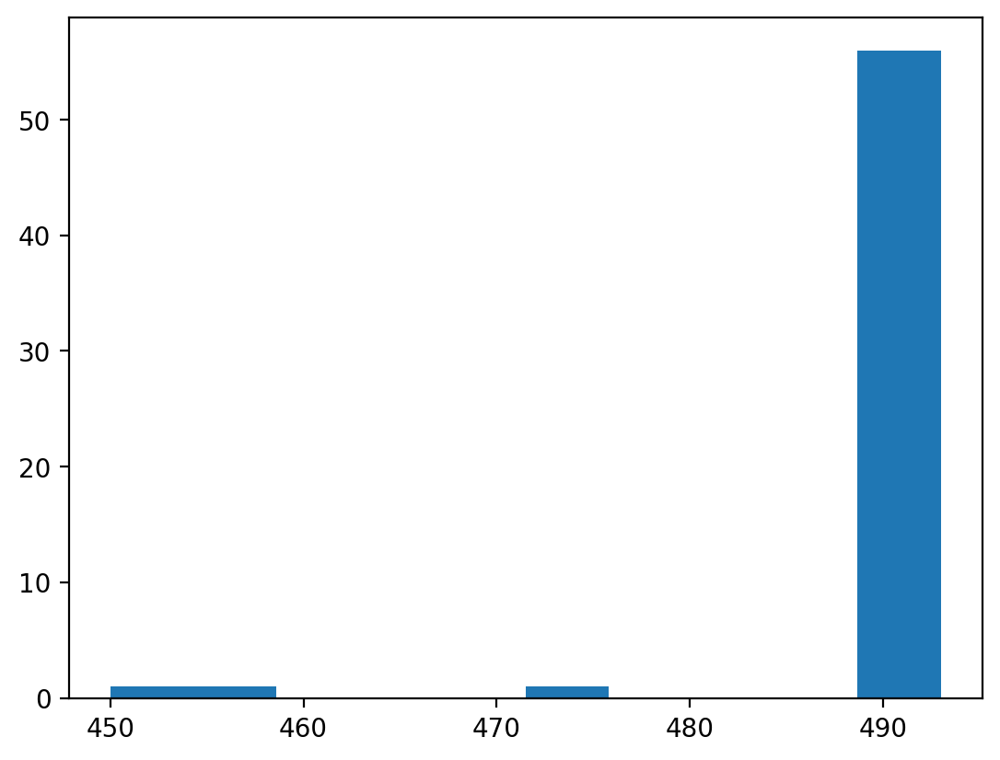

Summary of Columns with Missing Data:


,count,mean,min,25%,50%,75%,max,std
BQ,456.0,103.364323,1.331155,30.003413,67.546347,138.755976,344.644105,98.088272
CB,492.0,73.351475,12.49976,24.953565,44.608519,80.478694,2271.436167,131.266505
CC,491.0,0.684265,0.176874,0.551089,0.655807,0.767125,4.103032,0.277533
EL,450.0,69.949523,7.522944,31.983237,70.608895,109.125159,109.125159,38.493648
FC,492.0,72.505678,8.607984,26.06814,35.805672,57.199968,3030.655824,172.438519
FS,492.0,0.434683,0.06773,0.06773,0.257374,0.54184,31.365763,1.447858
Epsilon,473,2019-08-27 01:16:06.596194560,2012-05-17 00:00:00,2019-03-11 00:00:00,2019-07-29 00:00:00,2020-06-01 00:00:00,2020-09-29 00:00:00,NaN


In [11]:
plt.hist(train_summary['count'])
plt.show()
print("Summary of Columns with Missing Data:")
train_summary.loc[train_summary['count'] < 493]

In [12]:
# Find which columns have missing values 
sum_null = train_df.isnull().sum()
sum_null[sum_null!=0]

BQ           37
CB            1
CC            2
EL           43
FC            1
FS            1
Epsilon      20
EpochTime    20
dtype: int64

Start with simple imputation which will fill missing values with the mean of the other values recorded for that feature. Note that iterative imputation is also possible through sk learn: https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html#sklearn.impute.IterativeImputer

In [13]:
# Identify continuous variables (assuming they are numeric)
continuous_vars = train_df.select_dtypes(include='number').columns

# Perform mean imputation for continuous variables
train_df[continuous_vars] = train_df[continuous_vars].fillna(train_df[continuous_vars].mean())


In [14]:
# Check which columns still have missing values 
sum_null = train_df.isnull().sum()
sum_null[sum_null!=0]

Epsilon      20
EpochTime    20
dtype: int64

### Split Training Set into X and Y

In [34]:
columns = train_df.columns.drop(['Id','Class', 'Alpha', 'Beta', 'Gamma', 'Delta', 'EpochTime','Epsilon'])
columns

Index(['AB', 'AF', 'AH', 'AM', 'AR', 'AX', 'AY', 'AZ', 'BC', 'BD ', 'BN', 'BP',
       'BQ', 'BR', 'BZ', 'CB', 'CC', 'CD ', 'CF', 'CH', 'CL', 'CR', 'CS', 'CU',
       'CW ', 'DA', 'DE', 'DF', 'DH', 'DI', 'DL', 'DN', 'DU', 'DV', 'DY', 'EB',
       'EE', 'EG', 'EH', 'EL', 'EP', 'EU', 'FC', 'FD ', 'FE', 'FI', 'FL', 'FR',
       'FS', 'GB', 'GE', 'GF', 'GH', 'GI', 'GL', 'EJ_A', 'EJ_B'],
      dtype='object')

<font color = 'red'> Note that for the time being we remove the greek data from the training set since we want to train on only numerical data and one-hot encoding would introduce a lot of new features. </font>

In [35]:
# save x_train, y_train, X_test and Y_test as Numpy arrays
y_train = train_df['Class'].values
#y_test = test_df['Class'].values

X_train = train_df[columns].values
#X_test = test_df[columns].values


# # Check the shape of the train and test sets
#print('Shape X_train: ', X_train.shape, '\nShape X_test: ', X_test.shape,
     # '\nShape y_train: ', y_train.shape, '\nShape y_test:', y_test.shape)
    
print('Shape X_train: ', X_train.shape,
      '\nShape y_train: ', y_train.shape)

Shape X_train:  (493, 57) 
Shape y_train:  (493,)


### Standardize values between 0 and 1

In [36]:
y_train

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [39]:
#normalize all values to be between 0 and 1
X_train = (X_train-np.min(X_train))/(np.max(X_train)-np.min(X_train))

#view normalized array
print(X_train)

[[1.90705449e-06 8.50657489e-03 4.75313957e-04 ... 8.85416876e-07
  0.00000000e+00 5.57879269e-06]
 [1.62099632e-06 2.71988310e-02 4.75313957e-04 ... 1.28870111e-06
  0.00000000e+00 5.57879269e-06]
 [3.26583082e-06 1.48851459e-02 4.75313957e-04 ... 3.25585956e-07
  0.00000000e+00 5.57879269e-06]
 ...
 [9.77365427e-07 1.17768307e-02 4.75313957e-04 ... 1.22610706e-04
  5.57879269e-06 0.00000000e+00]
 [2.09775994e-06 1.85850878e-02 5.75060410e-04 ... 5.46777471e-05
  0.00000000e+00 5.57879269e-06]
 [1.21574724e-06 1.07443798e-03 1.09410150e-03 ... 1.22610706e-04
  5.57879269e-06 0.00000000e+00]]


<font color = 'red'> Note how we fit the normalization? only on the training data, and use the mean and sd parameters to transform the test data later..... </font>

# 4. EDA

### Data Distribution: Class

Note that we have an uneven representation of positive/negative diagnoses.

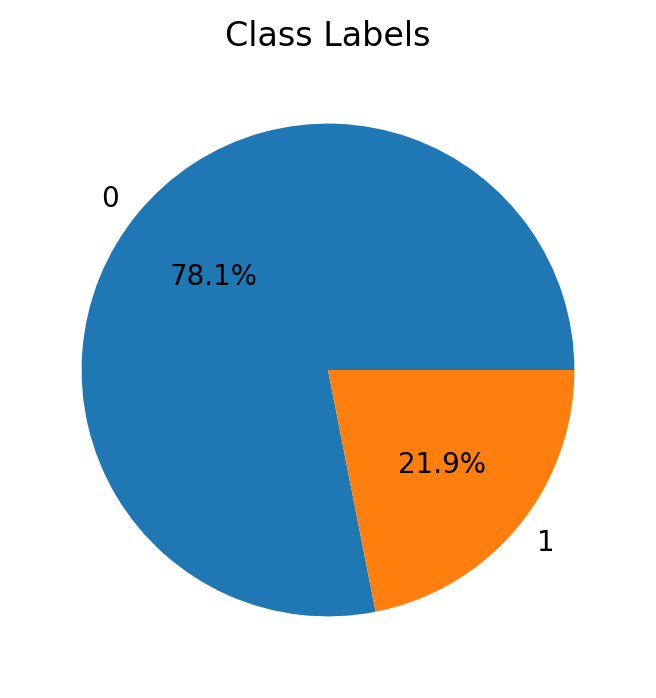

In [40]:
unique_elements, counts = np.unique(y_train, return_counts = True)

plt.figure(figsize=(4, 4))
plt.pie(counts, labels=unique_elements, autopct='%1.1f%%')
plt.title('Class Labels')
plt.show()

### EDA of Training Data

### <font color='red'>I think this doesn't work bc I didn't bring along the column names but really who tf knows:

</font> 

In [20]:
#This is an attempt to do a heat map

# X_df = pd.DataFrame(X_train)

# # Identify continuous variables (assuming they are numeric)
# continuous_vars = X_df.select_dtypes(include='number').columns

# # Perform mean imputation for continuous variables
# X_cont = X_df[continuous_vars]


# cm = np.corrcoef(X_cont, rowvar = False)
# hm = heatmap(
#     cm,
#     row_names=X_df,
#     column_names=variables)

### <font color='red'>Ew gross go make a correlation matrix dumb bish.

</font> 

In [44]:
scatterplotmatrix(
    X_train,
    figsize=(80,80), alpha=1
);

# 5. Model

# Example from Chat GPT

In [ ]:
import numpy as np
import tensorflow as tf

# Step 2: Prepare your data
# Replace these arrays with your actual data
train_features = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
train_labels = np.array([0, 1, 1, 1])  # Binary labels (0 or 1)

# Step 3: Create the perceptron model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(1, activation='sigmoid', input_shape=(2,))
])

# Step 4: Compile the model
model.compile(optimizer='sgd',  # Stochastic Gradient Descent optimizer
              loss='binary_crossentropy',  # Binary cross-entropy loss for binary classification
              metrics=['accuracy'])

# Step 5: Train the model
epochs = 100  # Number of training iterations
model.fit(train_features, train_labels, epochs=epochs)

# Step 6: Evaluate the model (optional)
# Replace these arrays with your actual testing data
test_features = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
test_labels = np.array([0, 1, 1, 1])
loss, accuracy = model.evaluate(test_features, test_labels)

print("Test accuracy:", accuracy)


## First Attempt: Basic Perceptron

<font color = 'turquoise'> 

    **Turquiose text is from chat GPT**
    
A basic perceptron is the simplest form of an artificial neural network. It consists of just one neuron (a node) with an input layer and an output layer, and it performs a linear binary classification.

The input layer consists of n input features (x1, x2, ..., xn), each represented by a numeric value. The neuron takes these input values, multiplies them by their corresponding weights (w1, w2, ..., wn), and then adds a bias term (b) to produce the weighted sum (also known as the activation). 
</font>

For the first attempt at training a perceptron model, I only use the training data which is numeric as perceptron only takes numeric or hot-encoded inputs...

In [ ]:
percep_train = X_train[:,1:56].astype(np.float32)
percep_train.shape

<font color = 'turquoise'> 

Here we make a perceptron using a tensorflow code/architecture from Chat GPT :) 
</font>

In [ ]:
def perceptron_model(num_features, activation = 'sigmoid', learning_rate = 0.001):
    
    #clear session and set random seed for consistent behavior
    tf.keras.backend.clear_session()
    tf.random.set_seed(1234)
    
    #Build model using Keras Sequential API
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(1, activation = activation, input_shape = (num_features,))
    ])
    
    #compile model
    sgd_optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate)
    adam_optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    model.compile(optimizer=adam_optimizer,  # Adam optimizer
                  loss='binary_crossentropy',  # Binary cross-entropy loss for binary classification
                  metrics=[tf.keras.metrics.AUC()])
    
    return model

In [ ]:
#LR for SGD model:
#model = perceptron_model(num_features = percep_train.shape[1], learning_rate = 0.000001)


model = perceptron_model(num_features = percep_train.shape[1], learning_rate = 0.0001)

In [ ]:
#Fit the model
tf.random.set_seed(1234)
np.random.seed(1234)
# Train model
hist= model.fit(x=percep_train,
                y=y_train,
                #validation_data=[X_test_std, y_test],
                validation_split=0.1, # set 10% of train data for validation
                #batch_size=len(percep_train), #this makes the batch size 493 so just one batch I guess?
                batch_size= 50,
                epochs=100,
                verbose=1 #silence fit
)

In [ ]:
model.summary()

In [ ]:
history.keys()

In [ ]:
# grab history
history = hist.history

# plot loss for train and validation
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
plt.plot(history['loss'], lw=2, color='darkgoldenrod')
plt.plot(history['val_loss'], lw=2, color='indianred')
plt.legend(['Train', 'Validation'], fontsize=10)
ax.set_xlabel('Epochs', size=10)
ax.set_title('Loss');

# plot accuracy for train and validation
ax = fig.add_subplot(1, 3, 2)
plt.plot(history['auc'], lw=2, color='darkgoldenrod')
plt.plot(history['val_auc'], lw=2, color='indianred')
plt.legend(['Train', 'Validation'], fontsize=10)
ax.set_xlabel('Epochs', size=10)
ax.set_title('AUC');

# # plot decision boundaries for train data
# ax = fig.add_subplot(1, 3, 3)
# plot_decision_regions(X=X_train_std, y=y_train,
#                       clf=model)
# ax.set_xlabel('alcohol', size=10)
# ax.set_ylabel('OD280/OD315_of_diluted_wines', size=10)
# ax.set_title('Train data predictions');

# Multilater Perceptron ???

In [ ]:
def mlp_model(num_features, activation = 'sigmoid', learning_rate = 0.001):
    
    #clear session and set random seed for consistent behavior
    tf.keras.backend.clear_session()
    tf.random.set_seed(1234)
    
    #Build model using Keras Sequential API
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(1, activation = activation, input_shape = (num_features,))
    ])
    
    #compile model
    sgd_optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate)
    model.compile(optimizer=sgd_optimizer,  # Stochastic Gradient Descent optimizer
                  loss='binary_crossentropy',  # Binary cross-entropy loss for binary classification
                  metrics=['accuracy'])
    
    return model

## Notes

Consider reducing dimensionality of data using PCA

Weight classes: 
    
    # Weight the classes
neg, pos = np.bincount(train_df_pca['Class'])
total = neg + pos

weight_for_0 = (1 / neg) * (total / 2.0)
weight_for_1 = (1 / pos) * (total / 2.0)

class_weight = {0: weight_for_0, 1: weight_for_1}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))


OR use Tensorflow code for it: 

history = rf.fit(train_ds, class_weight=class_weight)

Run model: 

rf = RandomForestClassifier(class_weight=class_weight,oob_score=True,random_state=42,criterion='entropy')

### Alternative approach: Use Perceptron Class from the Textbook

<font color='red'>You should evaluate whether the TF version and this perceptron class are doing the same thing...</font> 

In [ ]:

class Perceptron(object):
    """Perceptron classifier.

    Parameters
    ------------
    eta : float
      Learning rate (between 0.0 and 1.0)
    n_iter : int
      Passes over the training dataset.
    random_state : int
      Random number generator seed for random weight
      initialization.

    Attributes
    -----------
    w_ : 1d-array
      Weights after fitting.
    errors_ : list
      Number of misclassifications (updates) in each epoch.

    """
    def __init__(self, eta=0.01, n_iter=50, random_state=1):
        self.eta = eta
        self.n_iter = n_iter
        self.random_state = random_state

    def fit(self, X, y):
        """Fit training data.

        Parameters
        ----------
        X : {array-like}, shape = [n_examples, n_features]
          Training vectors, where n_examples is the number of examples and
          n_features is the number of features.
        y : array-like, shape = [n_examples]
          Target values.

        Returns
        -------
        self : object

        """
        rgen = np.random.RandomState(self.random_state)
        self.w_ = rgen.normal(loc=0.0, scale=0.01, size=1 + X.shape[1])
        self.errors_ = []

        for _ in range(self.n_iter):
            errors = 0
            for xi, target in zip(X, y):
                update = self.eta * (target - self.predict(xi))
                self.w_[1:] += update * xi
                self.w_[0] += update
                errors += int(update != 0.0)
            self.errors_.append(errors)
        return self

    def net_input(self, X):
        """Calculate net input"""
        return np.dot(X, self.w_[1:]) + self.w_[0]

    def predict(self, X):
        """Return class label after unit step"""
        return np.where(self.net_input(X) >= 0.0, 1, -1)